In [5]:
from google.colab import files
uploaded = files.upload()

Saving Company_Data.csv to Company_Data (1).csv


In [6]:
import pandas as pd
df =pd.read_csv("Company_Data.csv")
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes


In [7]:
# Define the bins and labels for the target variable
bins = [0, 2, 5, 8, 11, 14, 17]
labels = ['very low', 'low', 'medium low', 'medium', 'medium high', 'high']

# Use the pandas cut function to perform binning
df['Sales'] = pd.cut(df['Sales'], bins=bins, labels=labels)

# Print the first few rows of the DataFrame to see the results
df.head()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,medium,138,73,11,276,120,Bad,42,17,Yes,Yes
1,medium high,111,48,16,260,83,Good,65,10,Yes,Yes
2,medium,113,35,10,269,80,Medium,59,12,Yes,Yes
3,medium low,117,100,4,466,97,Medium,55,14,Yes,Yes
4,low,141,64,3,340,128,Bad,38,13,Yes,No


In [8]:
df["Sales"].mode()
df['Sales'].fillna("medium low", inplace=True)
df["Sales"].isna().sum()

0

<Axes: >

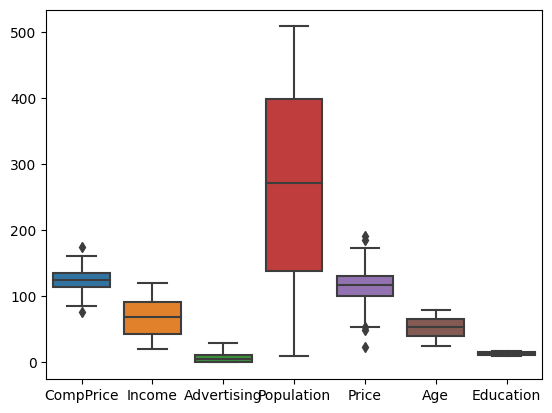

In [10]:
# Visualize the dataset using a boxplot
import seaborn as sns
sns.boxplot(data=df)

In [11]:
X = df.iloc[:,1:]

In [13]:
# Identify the outliers using the boxplot
import numpy as np
q1 = np.percentile(df['CompPrice'], 25)
q3 = np.percentile(df['CompPrice'], 75)
iqr = q3 - q1
lower_bound = q1 - (1.5 * iqr)
upper_bound = q3 + (1.5 * iqr)
outliers = df[(df['CompPrice'] < lower_bound) | (df['CompPrice'] > upper_bound)]

# Remove the outliers from the dataset
df = df[(df['CompPrice'] >= lower_bound) & (df['CompPrice'] <= upper_bound)]

In [14]:
# Identify the outliers using the boxplot
q1 = np.percentile(df['Price'], 25)
q3 = np.percentile(df['Price'], 75)
iqr = q3 - q1
lower_bound = q1 - (1.5 * iqr)
upper_bound = q3 + (1.5 * iqr)
outliers = df[(df['Price'] < lower_bound) | (df['Price'] > upper_bound)]

# Remove the outliers from the dataset
df = df[(df['Price'] >= lower_bound) & (df['Price'] <= upper_bound)]

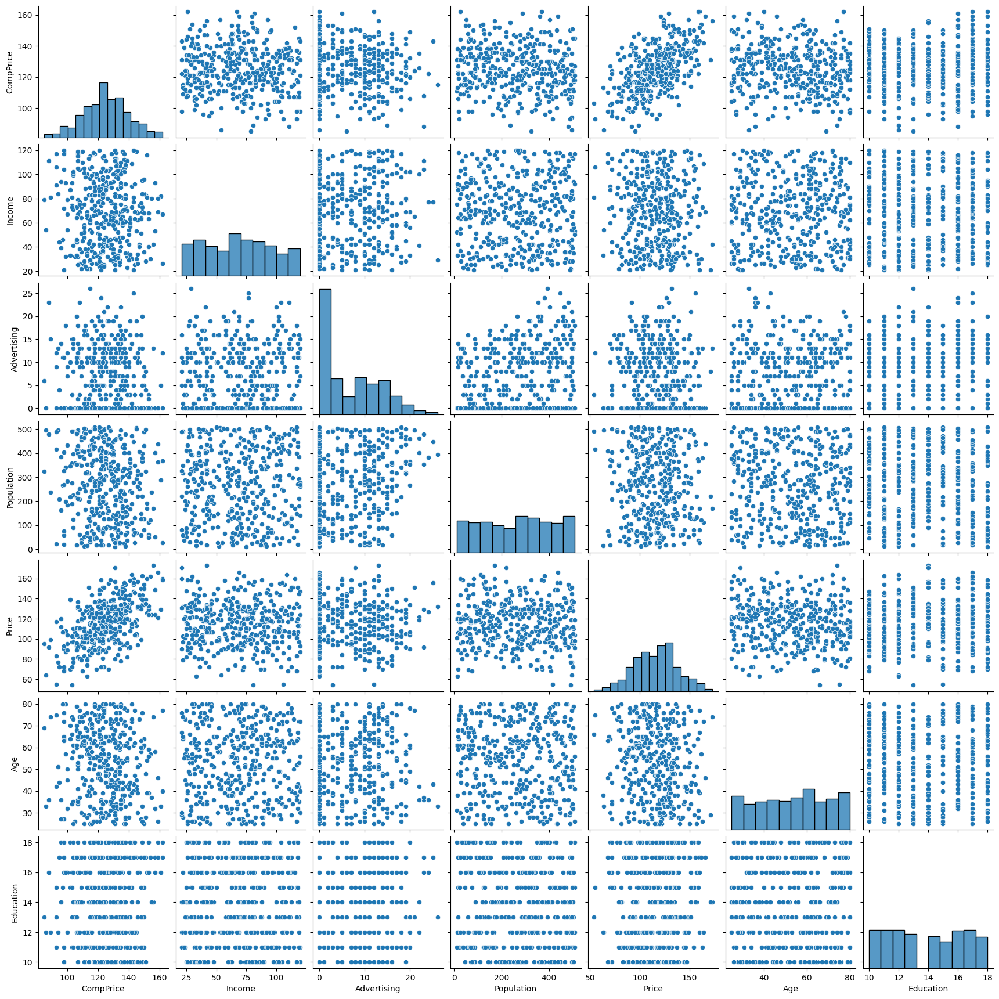

In [15]:
import seaborn as sns
sns.pairplot(df)


In [17]:
#Label_Encoding
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()
df["ShelveLoc"] = LE.fit_transform(df["ShelveLoc"])
df["Urban"] = LE.fit_transform(df["Urban"])
df["US"] = LE.fit_transform(df["US"])
df["Sales"] = LE.fit_transform(df["Sales"])

In [18]:
X = df.iloc[:,1:]
Y = df["Sales"]
Y

0      2
1      3
2      2
3      4
4      1
      ..
395    3
396    4
397    4
398    4
399    2
Name: Sales, Length: 394, dtype: int64

In [19]:
# step5: Data partition
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X,Y, test_size=0.3, random_state = 67)


In [20]:
from sklearn.ensemble import RandomForestClassifier
RFcls = RandomForestClassifier(max_features=0.3, max_samples=0.6, n_estimators = 100, random_state=4,max_depth=7)
RFcls.fit(X_train,Y_train)
Y_Pred_train = RFcls.predict(X_train)
Y_Pred_test = RFcls.predict(X_test)


In [21]:
from sklearn.metrics import accuracy_score
ac_train = accuracy_score(Y_train,Y_Pred_train)
print("accuracy Score train = ", ac_train.round(3))
ac_test = accuracy_score(Y_test,Y_Pred_test)
print("accuracy Score test = ", ac_test.round(3))


accuracy Score train =  0.971
accuracy Score test =  0.58


accuracy Score train =  0.736
accuracy Score test=  0.0
